In [1]:
import pandas as pd
import numpy as np
import math
import statistics
import scipy as sp
from scipy import stats

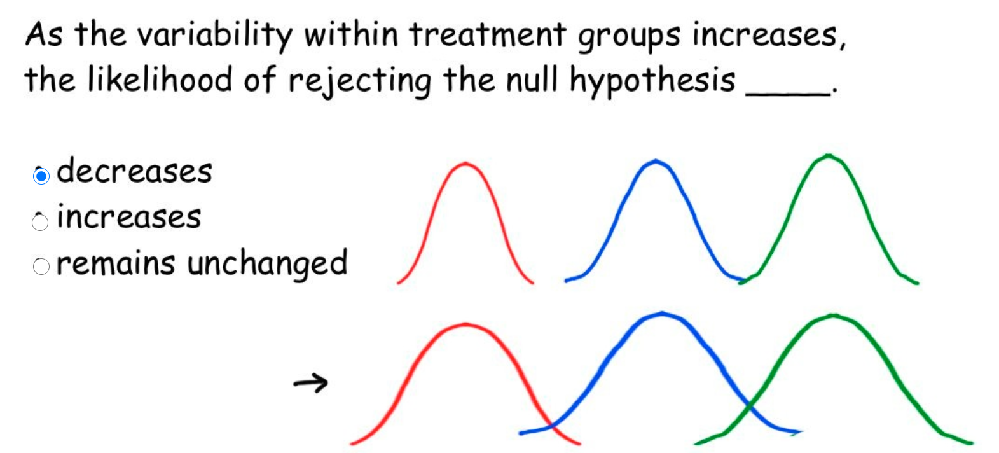

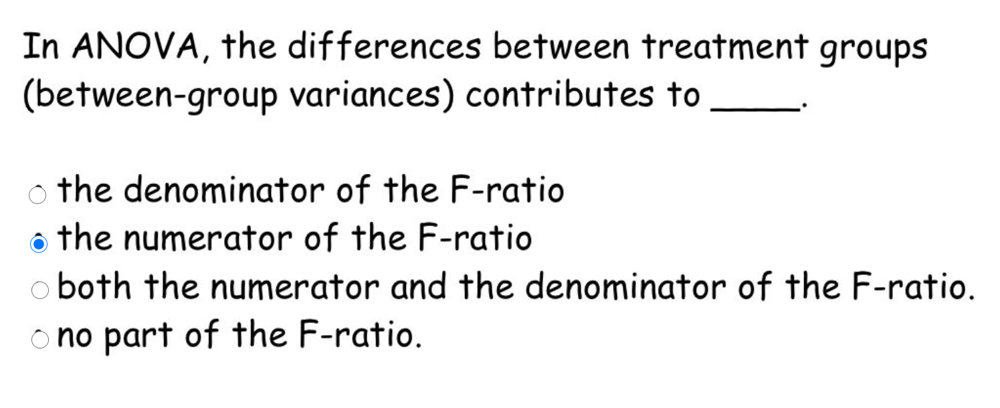

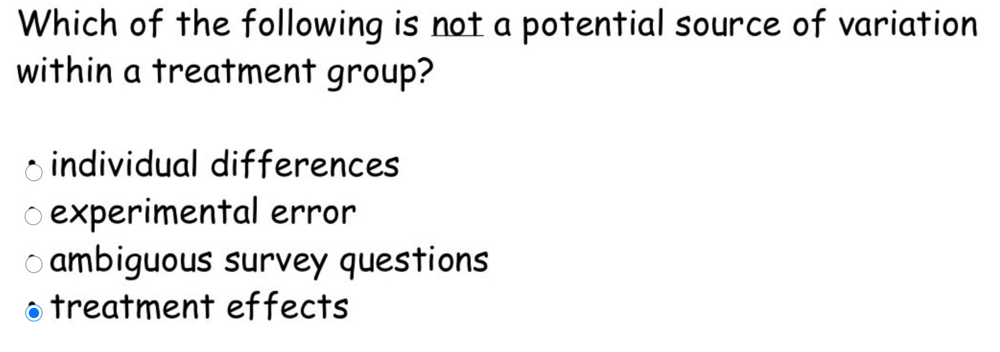

# Treatment effects would only increase variability between groups, not within a treatment group.

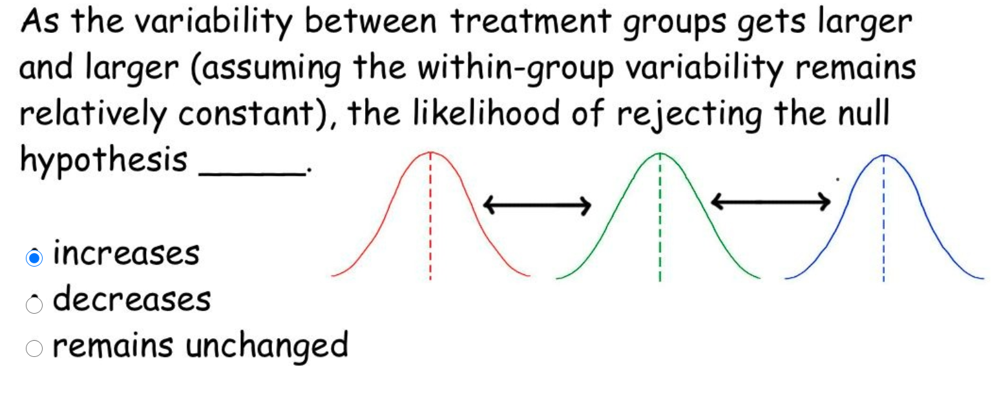

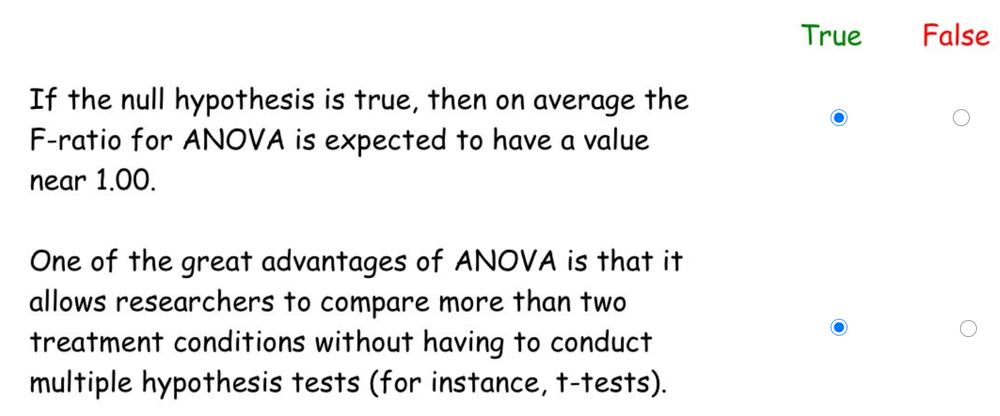

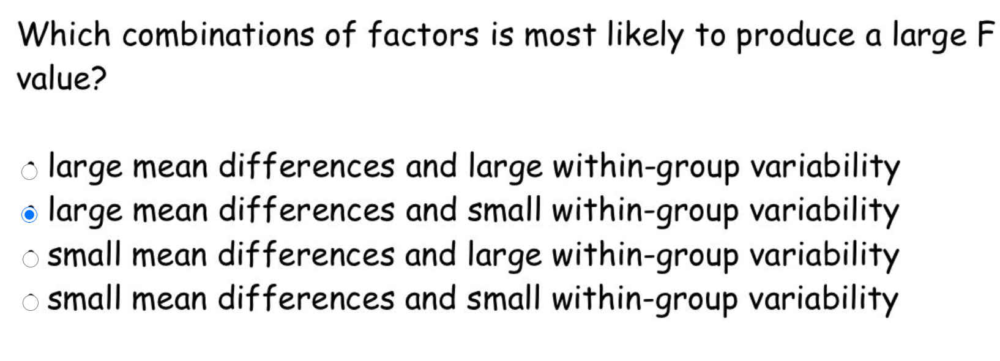

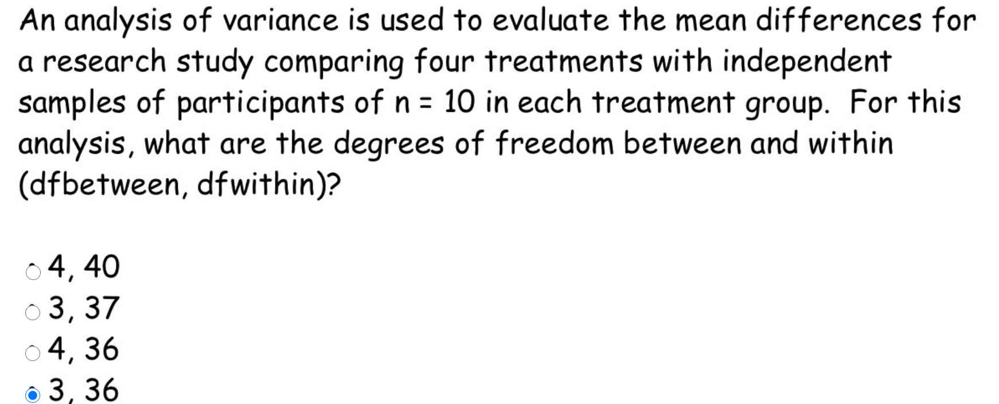


* Degree of freedom between = k - 1 = 3 -1 = 2 
    - **K is the number of population group.** in this example, 3

* Degree of freedom within = N -k = 9 -3 = 6
    - **N is total number of scores that we in our sample**

In [2]:
dfbetween= 4-1
dfbetween

3

In [3]:
dfwithin = 40-4 
dfwithin

36

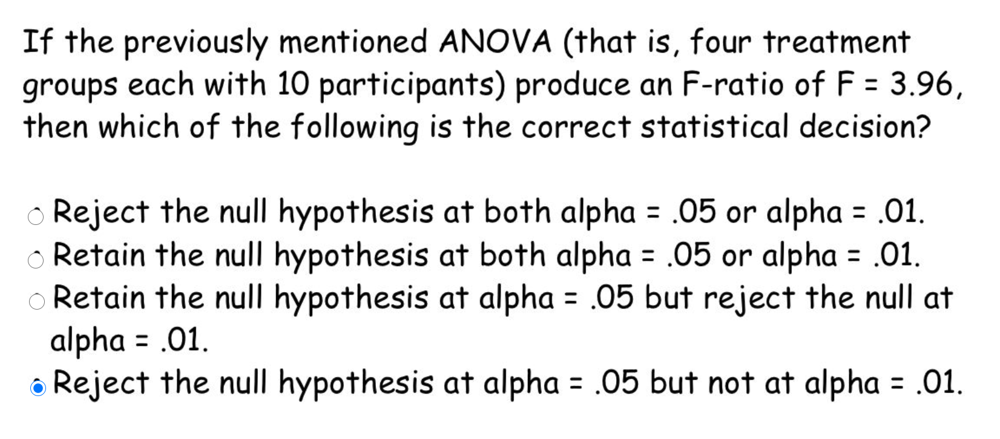

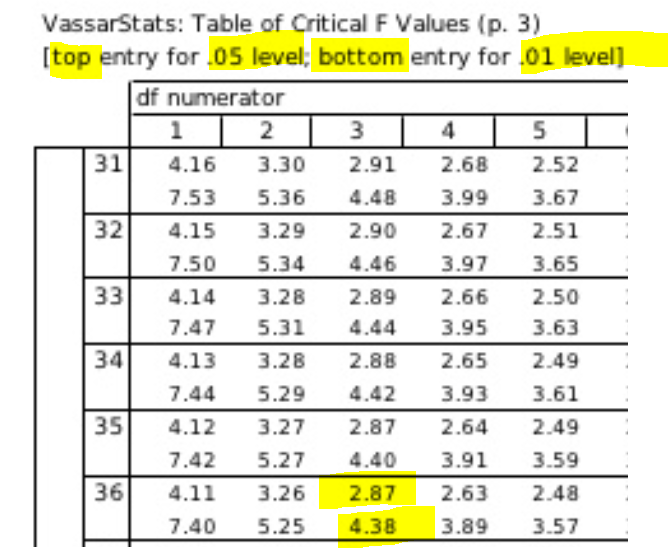

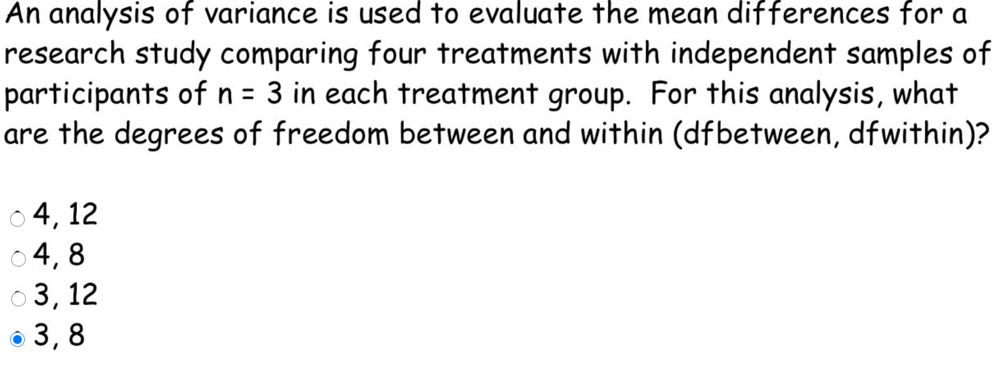


* Degree of freedom between = k - 1 = 3 -1 = 2 
    - **K is the number of population group.** in this example, 3

* Degree of freedom within = N -k = 9 -3 = 6
    - **N is total number of scores that we in our sample**

In [4]:
dfbetween=4-1
dfbetween

3

In [5]:
dfwithin = 3*4-4
dfwithin

8

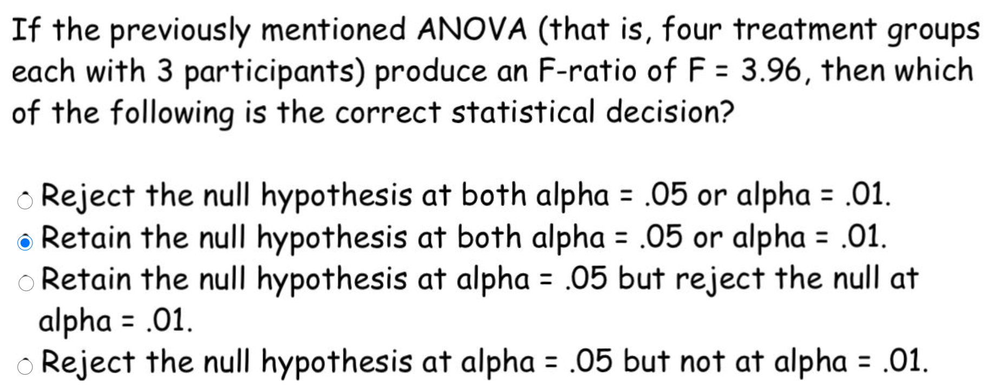

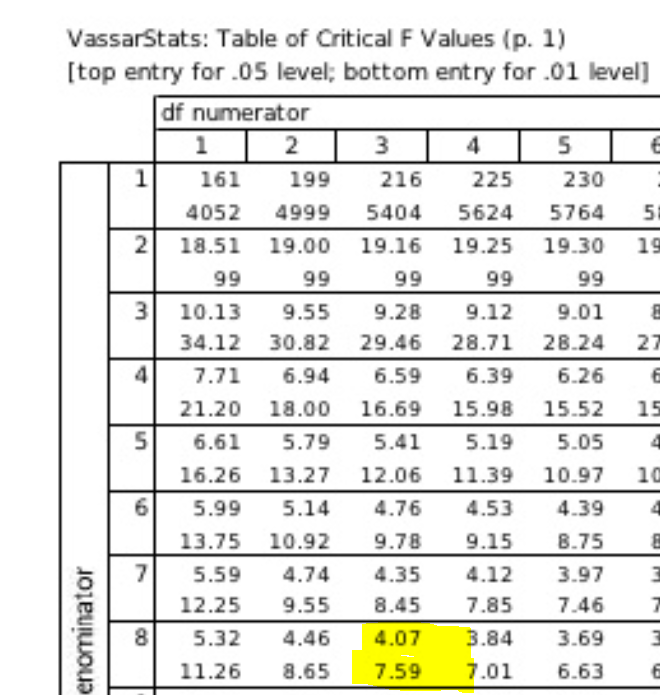

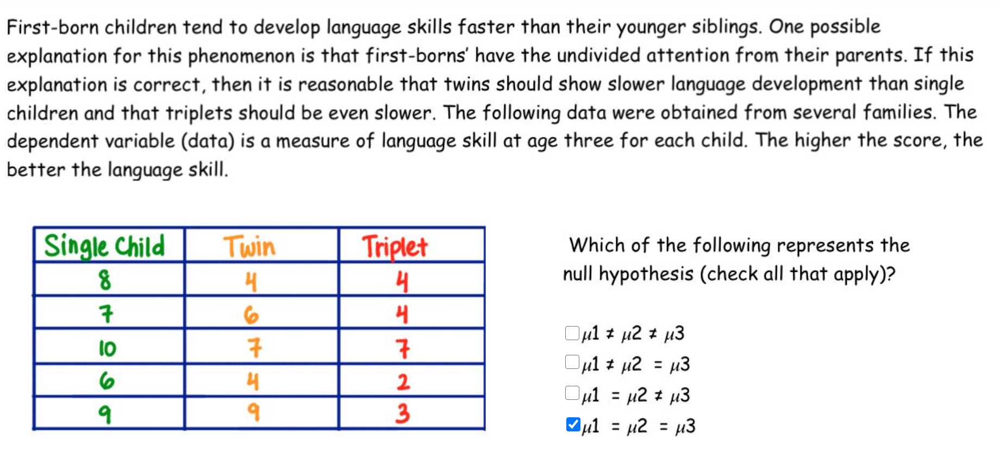

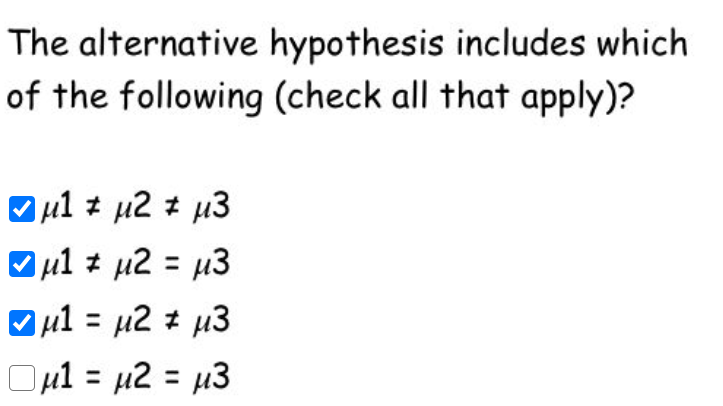

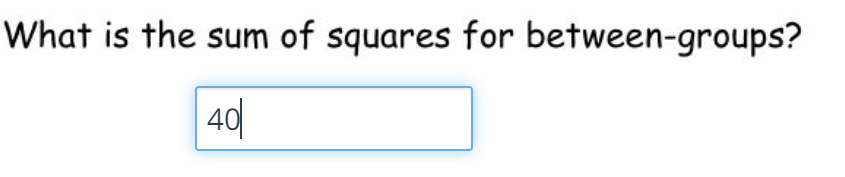

* sum of the squares total = sum(x-G/N)
* sum of the squares between =  sum of the squares total -  sum of the squares within 

In [27]:
single= np.array([8,7,10,6,9])
twin = np.array([4,6,7,4,9])
triple = np.array([4,4,7,2,3])

In [28]:
xbar1=sum(single)/len(single)
xbar1

8.0

In [29]:
xbar2=sum(twin)/len(twin)
xbar2

6.0

In [30]:
xbar3 = sum(triple)/len(triple)
xbar3

4.0

In [31]:
gm= sum(single + twin+triple ) / 15
gm

6.0

In [63]:
sum((single-gm)**2)

30.0

In [69]:
sum((twin-gm)**2)

18.0

In [71]:
sum((triple-gm)**2)

34.0

In [72]:
30+18+34

82

In [85]:
# sswithin = 42
ssbetween = 82-42
ssbetween

40

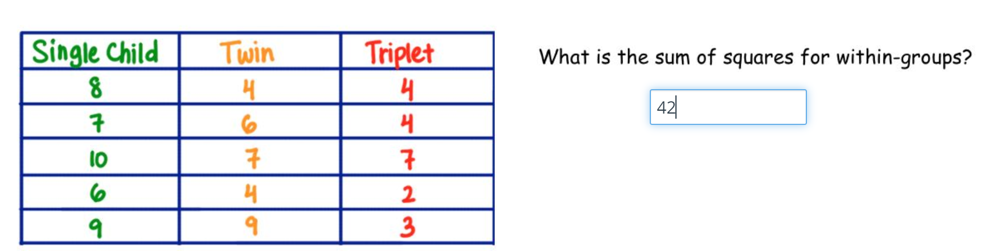

In [34]:
sswithin = sum((single-xbar1)**2) + sum((twin-xbar2)**2) + sum((triple-xbar3)**2)
sswithin

42.0

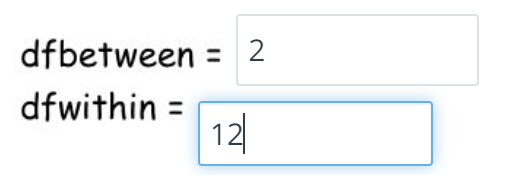

In [97]:
dfbetween=3-1
dfbetween

2

In [98]:
dfwithin= len(single)+len(twin)+len(triple)-3
dfwithin

12

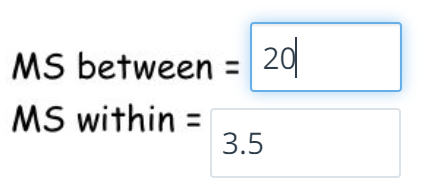

In [83]:
mean_sqare_b = ssbetween/dfbetween
mean_sqare_b

20.0

In [84]:
mean_sqare_w = sswithin/dfwithin
mean_sqare_w

3.5

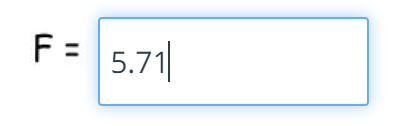

In [86]:
f_stats = mean_sqare_b/mean_sqare_w
f_stats

5.714285714285714

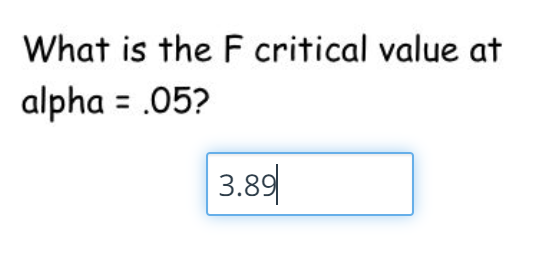

* t-table https://www.slideshare.net/gforce003/ftable

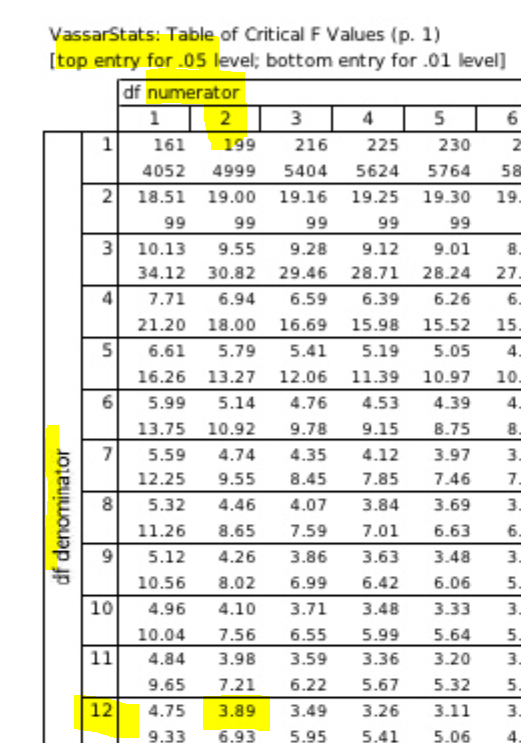

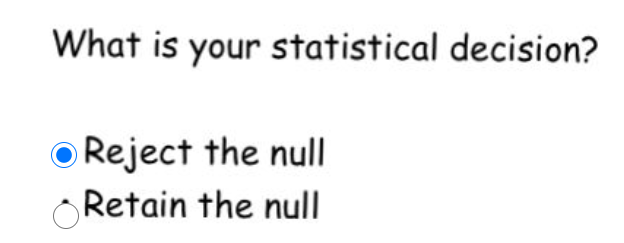

* f_stats is bigger than t-critical. = reject Ho.

# f_stats,f_critical,p_value by Scipy

In [104]:
# get ANOVA table as R like output
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [92]:
df=pd.DataFrame([single,twin,triple],index=["single","twin","triple"])
df

,0,1,2,3,4
single,8,7,10,6,9
twin,4,6,7,4,9
triple,4,4,7,2,3


In [94]:
df =df.swapaxes("index", "columns") 
df

,single,twin,triple
0,8,4,4
1,7,6,4
2,10,7,7
3,6,4,2
4,9,9,3


In [105]:
# stats f_oneway functions takes the groups as input and returns F and P-value

f_stats, pvalue = stats.f_oneway(df["single"],df["twin"],df["triple"])
print(f_stats, pvalue )

5.714285714285714 0.018055629234348


In [106]:
#find F critical value
# q: The significance level to use. 1-.05 = alpha 0.05
# dfn: The numerator degrees of freedom(dfbetween)
# dfd: The denominator degrees of freedom (dfwithin)

f_critical = sp.stats.f.ppf(q=1-.05, dfn=dfbetween, dfd=dfwithin)
f_critical

3.8852938346523933

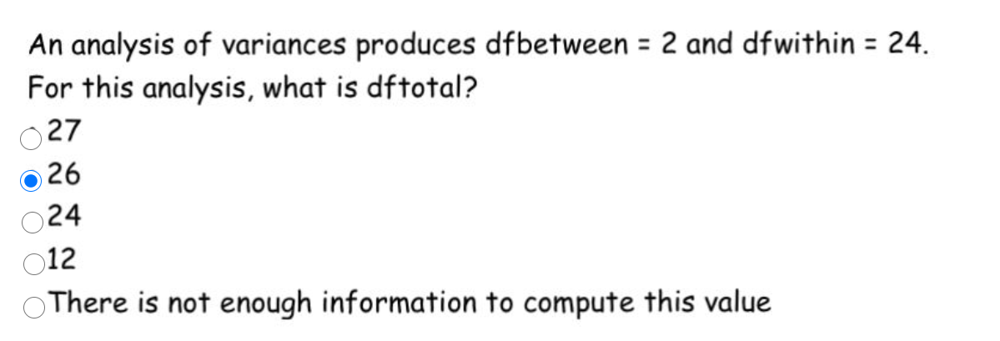

* Degree of difference total = Degree of freedowm between + degree of freedom within

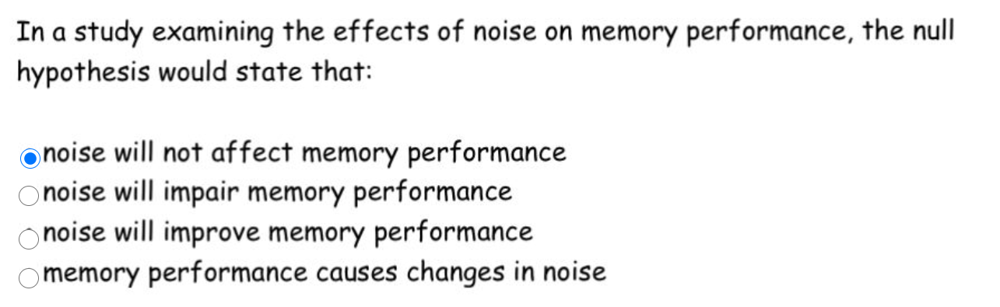

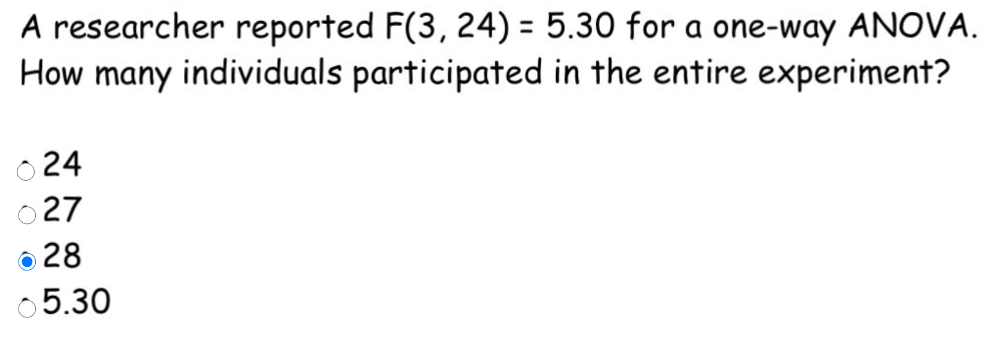

* Degree of freedom between = 3
* Degree of freedome within = 24
* dfwithin = N-k / 24 = N-4
* dfbetween = k - 1 . / 3 = k-1 which means k is 4. 
* N = dfwithin + k / 24+4 = 28

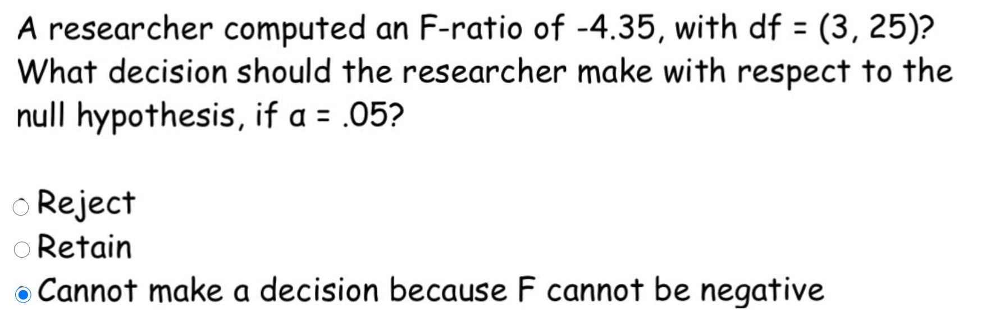

In [107]:
f_critical = sp.stats.f.ppf(q=1-.05, dfn=3, dfd=25)
f_critical

2.991240909549952

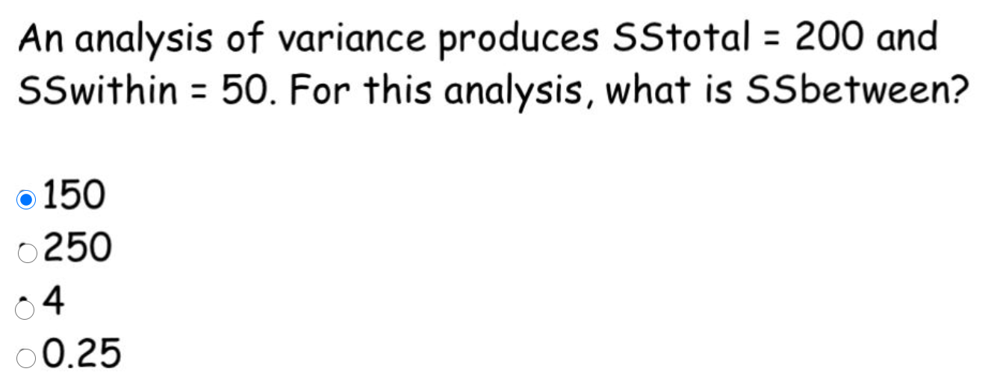

* Degree of difference total = Degree of freedowm between + degree of freedom within

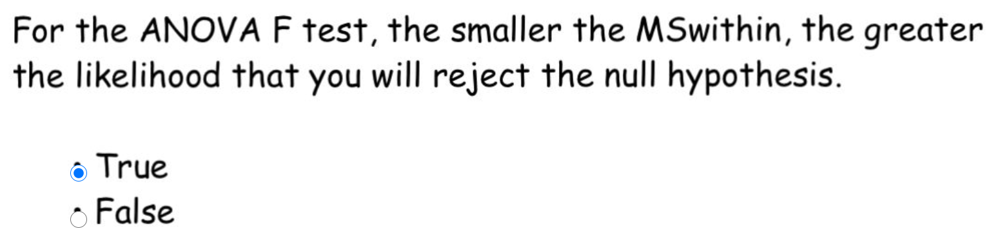

* MS within will be denominator of f-stats. The greter f, more likely to reject Ho. 
* f_stats = mean_sqare_b/mean_sqare_w